# Per-mouse oscillatory eyeball plots

The grand-average [`oscillatory_eyeballs.ipynb`](oscillatory_eyeballs.ipynb) concatenates every
mouse's LFP together before computing spectrograms, so a subject whose spectral activity is
anomalous in one area can be washed out of the channel-meaned grand average yet still skew the
**trial-level** nonparametric contrasts in [`oscillatory_contrasts.ipynb`](oscillatory_contrasts.ipynb)
(the RL discrepancy we're chasing). This notebook rebuilds the spectrogram pipeline **per mouse and
per condition** so we can eyeball each subject and hunt for that outlier.

### Why the alignment prelude is kept
Some mice have **two probes in one visual area** — `sub-621890` and `sub-632485` have two in LM
(`VISl`), and **`sub-637908` has two in RL (`VISrl`)**. The grand pipeline (`aligned_grandcat.ipynb`)
runs a per-condition `GrandConcatenation` that walks `sorted(subjects)` in probe order, using the
saved global laminar aligner (`/mnt/data/000253/visual_alignment`) to relabel each probe onto a
common anatomical channel frame, and simply **concatenates the two same-area probes' trials**. So in
the grand data `sub-637908` contributes *twice* as many trials to RL as any other mouse — a concrete
candidate for why the RL contrasts look different while the grand-average eyeballs don't.

We reproduce that packing faithfully, but **per subject** rather than pooled across subjects:

1. load each subject's per-condition `Sampling`,
2. `visual_align` (select `VIS*` + spatial median filter) — as in `aligned_grandcat.ipynb`,
3. align each probe to the common anatomical frame with the **saved global aligner**, driven with
   the *same per-condition, sorted-subject, probe-order index* `k` that grandcat uses (so the doubled
   probes get their correct alignment windows and don't crash),
4. pool trials of same-area probes **within the subject** (this is the "subject-condition-area"
   packing that feeds the contrasts),
5. `downsample(4)` then a Hann-tapered `Spectrogram` — as in `grand_spectrogram.ipynb`.

Crucially the spectrogram is kept **trial-resolved** (`EpochedTfr`, not trial-averaged), so we can
relate per-mouse spectral activity to the trial-dimension contrasts, and can split the doubled-probe
subjects back into their individual probes. Per-mouse spectrograms are expensive (SynCoPy + Dask),
so they're cached under `SPECTRO_ROOT` and skipped unless `FORCE_RECOMPUTE = True`.

In [1]:
%cd ../..

/home/eli/AnacondaProjects/epych


In [2]:
%env DASK_LOGGING__DISTRIBUTED=CRITICAL
%env OMPI_MCA_btl_sm_backing_directory=/mnt/data/tmp_storage
%env SPYTMPDIR=/mnt/data/tmp_storage
%env SPYLOGLEVEL=CRITICAL
%env SPYPARLOGLEVEL=CRITICAL

env: DASK_LOGGING__DISTRIBUTED=CRITICAL
env: OMPI_MCA_btl_sm_backing_directory=/mnt/data/tmp_storage
env: SPYTMPDIR=/mnt/data/tmp_storage
env: SPYLOGLEVEL=CRITICAL
env: SPYPARLOGLEVEL=CRITICAL


In [3]:
import collections
import functools
import glob
import logging
import math
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import quantities as pq

import epych
from epych.statistics import alignment, spectrum

[striatum:56536] shmem: mmap: an error occurred while determining whether or not /tmp/ompi.striatum.1000/jf.0/1528037376/shared_mem_cuda_pool.striatum could be created.
[striatum:56536] create_and_attach: unable to create shared memory BTL coordinating structure :: size 134217728 


In [4]:
%matplotlib inline

In [5]:
logging.basicConfig(level=logging.INFO)

## Constants (shared with `oscillatory_eyeballs.ipynb`)

In [6]:
ADAPTED_ONSET = pq.Quantity(-1.0) * pq.second
ADAPTED_OFFSET = pq.Quantity(-0.5) * pq.second
ODDBALL_ONSET = pq.Quantity(-1.9017372477960602e-14) * pq.second
ODDBALL_OFFSET = pq.Quantity(0.5004545430388676) * pq.second
EVENTS = {
    "Oddball": (ODDBALL_ONSET.magnitude, 'lightgreen'),
    "Offset": (ODDBALL_OFFSET.magnitude, 'red'),
}
FREQ_RANGE = (spectrum.THETA_BAND[0], spectrum.GAMMA_BAND[1])

In [7]:
CONDITIONS = ["lonaive", "go_gloexp", "go_seqctl", "lo_gloexp", "lo_rndctl", "igo_seqctl"]
CONDITION_TITLES = {
    "lonaive": "Habituation",
    "go_gloexp": "xxxX [B1]",
    "go_seqctl": "xxxx [B3]",
    "lo_gloexp": "xxxY [B1]",
    "lo_rndctl": "XXXY [B2]",
    "igo_seqctl": "yyyy [B3]"
}
CONTRAST_VLIMS = {"dd": 9., "go": 5., "ssa": 10.}
CONDITION_VLIMS = {
    "lonaive": CONTRAST_VLIMS["dd"],
    "go_gloexp": CONTRAST_VLIMS["go"],
    "go_seqctl": CONTRAST_VLIMS["go"],
    "lo_gloexp": CONTRAST_VLIMS["ssa"],
    "lo_rndctl": CONTRAST_VLIMS["dd"],
    "igo_seqctl": CONTRAST_VLIMS["ssa"]
}

In [8]:
area_titles = {
    "VISal": "AL", "VISam": "AM", "VISl": "LM",
    "VISp": "V1", "VISpm": "PM", "VISrl": "RL",
}
def stattitle(name, stat=None):
    return area_titles.get(name, name)
anatomical_areas = ['VISp', 'VISl', 'VISrl', 'VISal', 'VISpm', 'VISam']

## Per-mouse pipeline

`visual_align` and `initialize_spectrum` are copied from `aligned_grandcat.ipynb` /
`grand_spectrogram.ipynb`; `aligner` is the **saved global** laminar alignment, used exactly as
grandcat uses it.

In [9]:
NWB_SUBJECTS = sorted(glob.glob('/mnt/data/000253/sub-*/'))
SUBJECTS = [d.rstrip('/').split('/')[-1] for d in NWB_SUBJECTS]
SUBJECT_DIRS = dict(zip(SUBJECTS, NWB_SUBJECTS))
logging.info("Found %d subjects", len(SUBJECTS))

INFO:root:Found 14 subjects


In [10]:
# Saved global laminar alignment (built in laminar_alignment.ipynb). NOT rebuilt per mouse.
aligner = epych.statistics.alignment.AlignmentSummary.unpickle(
    "/mnt/data/000253/visual_alignment")

In [11]:
def visual_align(signal):
    """VIS-channel selection + spatial median filter, exactly as in aligned_grandcat.ipynb."""
    return signal.select_channels(
        ["VIS" in loc for loc in signal.channels.location]).median_filter()

In [12]:
def probe_area(channels_or_signal):
    """The area key for a probe = common prefix of its VIS channel locations (as location_prefix)."""
    if hasattr(channels_or_signal, "channels"):
        locs = list(channels_or_signal.channels.location)
    else:
        locs = [str(l) for l in channels_or_signal if "VIS" in str(l)]
    return os.path.commonprefix(locs)

In [13]:
def area_k_index(cond):
    """Reproduce grandcat's per-condition alignment index k WITHOUT loading full Samplings.

    grandcat runs one GrandConcatenation per (condition, area) and walks sorted(subjects) in probe
    order, incrementing that area's k each time a probe maps to it. We recover the same k per
    (subject, probe) from the cheap channels.csv files, so per-subject computation can be cached and
    skipped without disturbing the global ordering."""
    counter = collections.defaultdict(int)
    index = {}          # (subject, probe) -> (area, k)
    for subject in SUBJECTS:
        cdir = SUBJECT_DIRS[subject] + cond
        if not os.path.exists(cdir):
            continue
        for pdir in sorted(glob.glob(cdir + "/probe*/")):
            probe = os.path.basename(pdir.rstrip("/"))
            ch = pd.read_csv(pdir + "channels.csv")
            area = probe_area(ch["location"].values)
            if not area.startswith("VIS"):
                continue
            index[(subject, probe)] = (area, counter[area])
            counter[area] += 1
    return index

In [14]:
def initialize_spectrum(key, signal, path=None):
    return epych.statistics.spectrum.Spectrogram(
        signal.df, signal.channels, signal.f0, taper="hann",
        path=path + "/" + key, time_window=0.200)

In [15]:
def pool_trials(sigs):
    """Concatenate aligned same-area probes along the trial axis (as GrandConcatenation does)."""
    if len(sigs) == 1:
        return sigs[0]
    base = sigs[0]
    ntimes = min(s.data.shape[1] for s in sigs)
    data = pq.Quantity(
        np.concatenate([s.data.magnitude[:, :ntimes, :] for s in sigs], axis=-1),
        base.data.units)
    return base.__class__(base.channels, data, base.dt, base.times[:ntimes])

In [16]:
SPECTRO_ROOT = "/mnt/data/000253/subject_spectrogram_downsample4"
FORCE_RECOMPUTE = False

In [17]:
def doubled_areas(cond):
    """(subject, area) -> [probes] for areas a subject covers with >1 probe (the pooled cases),
    derived from the cheap k-index scan so it is available even when spectrograms are cache-hits."""
    by = collections.defaultdict(list)
    for (subject, probe), (area, _) in area_k_index(cond).items():
        by[(subject, area)].append(probe)
    return {sa: probes for sa, probes in by.items() if len(probes) > 1}

In [18]:
def subject_area_signals(cond, subject, kindex):
    """Align this subject's probes to the common anatomical frame (saved global aligner, correct
    global k) and pool same-area probes' trials within the subject. Returns {area: EpochedLfp}."""
    cdir = SUBJECT_DIRS[subject] + cond
    if not os.path.exists(cdir):
        return None, {}
    samp = epych.recording.Sampling.unpickle(cdir).smap(visual_align)
    per_area = collections.defaultdict(list)   # area -> [(probe, aligned_signal), ...]
    for probe, sig in samp.signals.items():
        if (subject, probe) not in kindex:
            continue
        area, k = kindex[(subject, probe)]
        aligned = aligner.stats[area].align(k, sig)
        per_area[area].append((probe, aligned))
    signals, layout = {}, {}
    for area, items in per_area.items():
        signals[area] = pool_trials([a for _, a in items])
        layout[area] = [(p, a.num_trials) for p, a in items]
    return layout, signals

In [19]:
def subject_condition_summary(cond, subject, kindex):
    """Per-area, trial-resolved Spectrogram Summary for one mouse/condition (cached)."""
    spectro_path = "%s_%s/%s" % (SPECTRO_ROOT, cond, subject)
    summary = epych.statistic.Summary(
        alignment.location_prefix, functools.partial(initialize_spectrum, path=spectro_path))
    if os.path.exists(spectro_path) and not FORCE_RECOMPUTE:
        return epych.statistic.Summary.unpickle(
            spectro_path, epych.statistics.spectrum.Spectrogram)

    layout, signals = subject_area_signals(cond, subject, kindex)
    if not signals:
        return None
    # dict input (not a Sampling): downsample each aligned+pooled area signal, as grand_spectrogram.
    summary.calculate([{area: sig.downsample(4) for area, sig in signals.items()}])
    summary.pickle(spectro_path)
    logging.info("Computed spectrograms for %s / %s (%s)", cond, subject,
                 {a: sum(n for _, n in l) for a, l in layout.items()})
    return summary

## Compute per-mouse spectrograms

The expensive cell (one SynCoPy/Dask run per subject×condition; cached to disk). The spectrograms
are computed and stored **trial-resolved**; here we reduce each to a trial-averaged dB TFR for the
eyeball grids and record the pooled trial count. The trial-resolved data stays on disk in the cache
(reloaded on demand by the doubled-probe diagnostic below) rather than held in memory.

In [20]:
eyeballs = {cond: {} for cond in CONDITIONS}     # [cond][subject][area] -> EvokedTfr (dB)
num_trials = {cond: {} for cond in CONDITIONS}    # [cond][subject][area] -> pooled n

for cond in CONDITIONS:
    kindex = area_k_index(cond)
    for subject in SUBJECTS:
        summary = subject_condition_summary(cond, subject, kindex)
        if summary is None or not summary.stats:
            continue
        raw = summary.results()                       # Sampling of trial-resolved EpochedTfr
        num_trials[cond][subject] = {a: raw.signals[a].num_trials for a in raw.signals}
        db = raw.smap(
            lambda sig: sig.oscillatory().select_freqs(*FREQ_RANGE)
        ).erp().smap(lambda t: t.decibels())
        eyeballs[cond][subject] = {a: db.signals[a] for a in db.signals}
        del summary, raw, db
    logging.info("Built per-mouse spectrograms for condition %s", cond)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:03<00:00,  1.78s/it]
INFO:root:Computed spectrograms for lonaive / sub-621890 ({'VISam': 50, 'VISpm': 50, 'VISp': 50, 'VISl': 100, 'VISrl': 50})
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:03<00:00,  1.76s/it]
INFO:root:Computed spectrograms for lonaive / sub-632485 ({'VISam': 50, 'VISpm': 50, 'VISp': 50, 'VISl': 100, 'VISrl': 50})
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:03<00:00,  1.75s/it]
INFO:root:Computed spectrograms for lonaive / sub-632487 ({

## Eyeball grids: every mouse side-by-side, per condition and area

One trial-averaged spectrogram panel per mouse (oddball window, shared scale
`±CONDITION_VLIMS[cond]`). Because probes are now on a common anatomical frame, panels are directly
comparable across mice. `sub-637908`'s RL panel reflects its **pooled 100 trials** — i.e. exactly
the RL input the contrasts see.

In [21]:
def oddball_window(sig):
    return sig[ODDBALL_ONSET.magnitude - 0.050:ODDBALL_OFFSET.magnitude + 0.050]

def mouse_grid(cond, area, ncols=5):
    subjects = [s for s in SUBJECTS if s in eyeballs[cond] and area in eyeballs[cond][s]]
    if not subjects:
        return None
    vlim = CONDITION_VLIMS[cond]
    nrows = math.ceil(len(subjects) / ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 3 * nrows),
                             squeeze=False, layout="constrained")
    img = None
    for i, subject in enumerate(subjects):
        ax = axes[i // ncols][i % ncols]
        n = num_trials[cond].get(subject, {}).get(area)
        title = "%s (n=%d)" % (subject.replace("sub-", ""), n) if n else subject
        img = oddball_window(eyeballs[cond][subject][area]).heatmap(
            ax=ax, fig=fig, vmin=-vlim, vmax=vlim, cbar=False,
            title=title, tlabel="Time (ms)", **EVENTS)
    for j in range(len(subjects), nrows * ncols):
        axes[j // ncols][j % ncols].axis("off")
    if img is not None:
        fig.colorbar(img, ax=axes, shrink=0.6, label="Power (dB)", location="right")
    fig.suptitle("%s — %s (%s), per mouse" % (
        stattitle(area), CONDITION_TITLES[cond], cond), fontsize=16)
    return fig

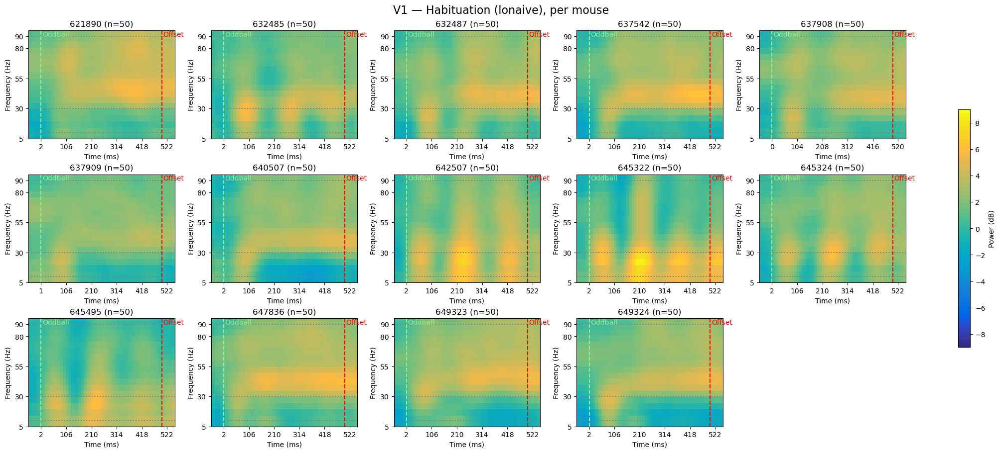

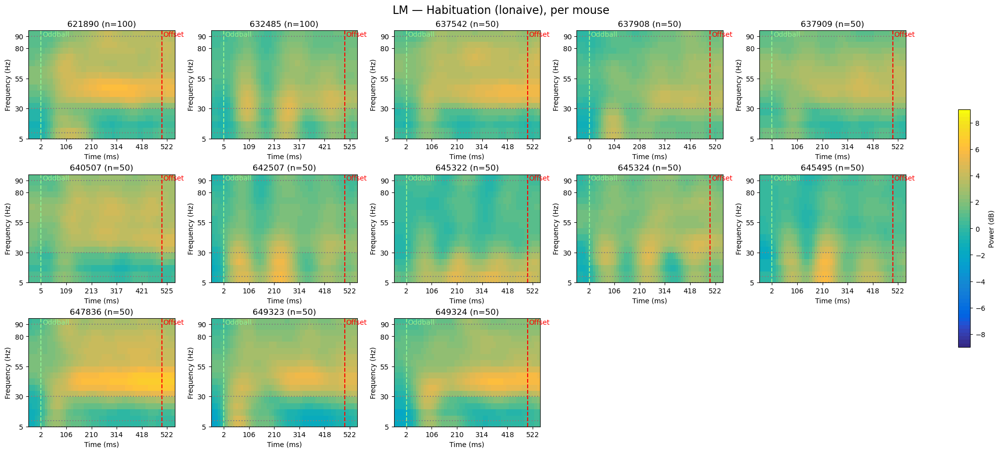

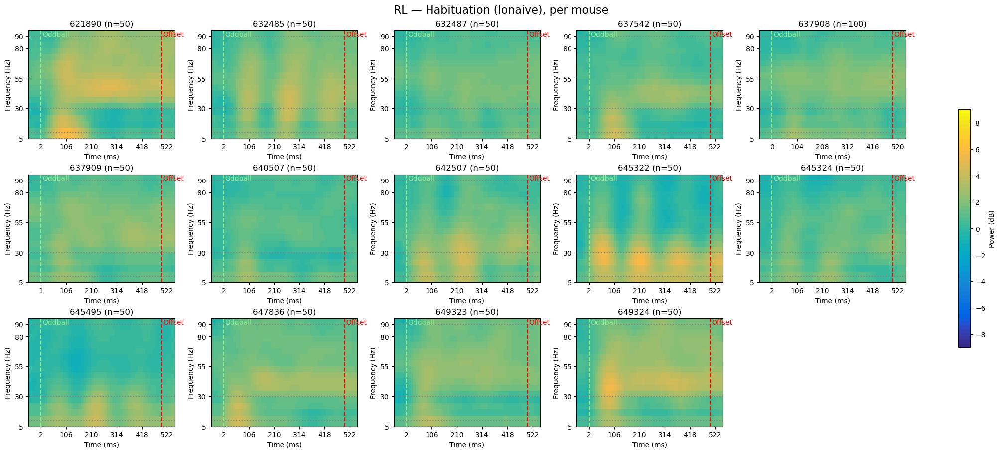

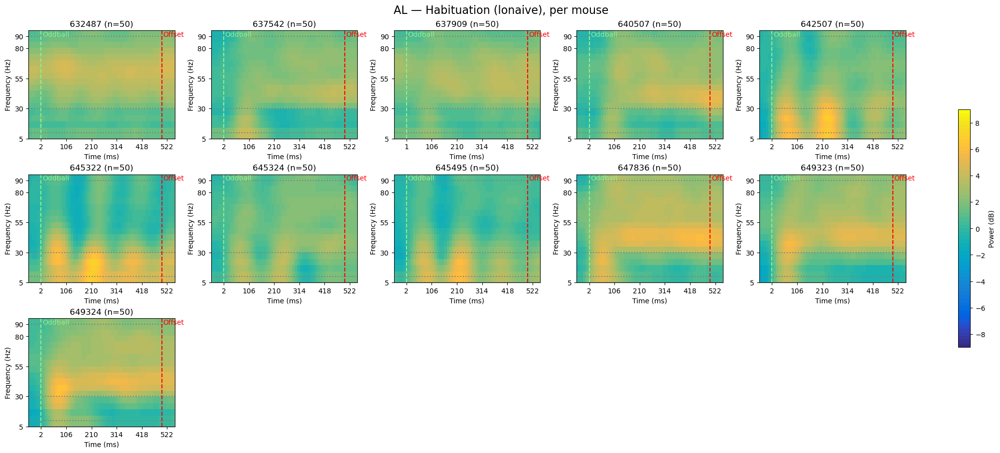

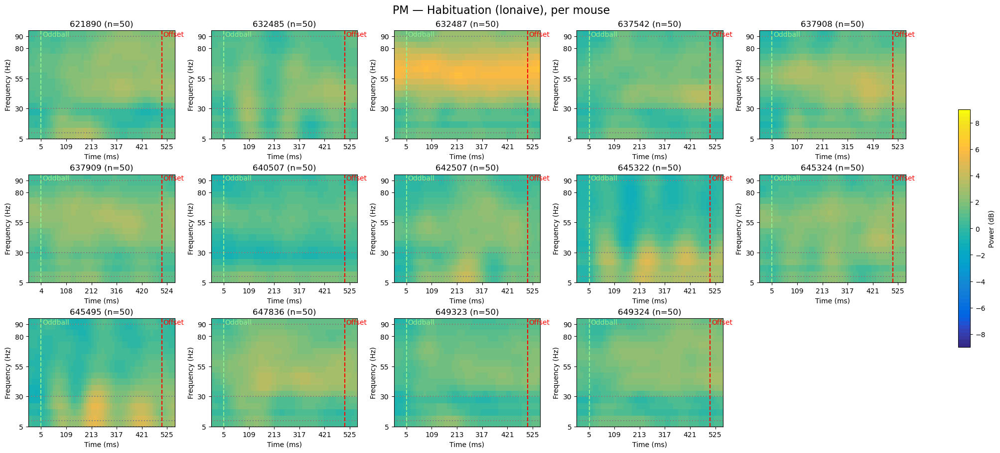

...

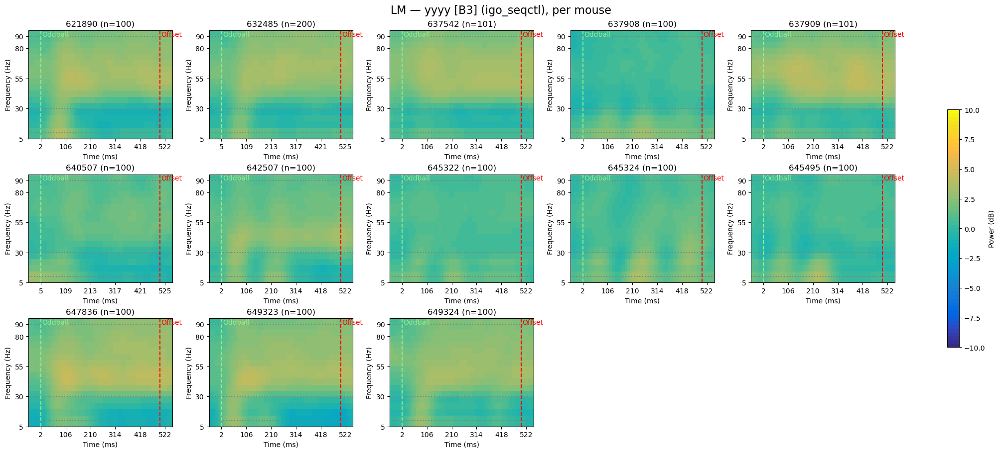

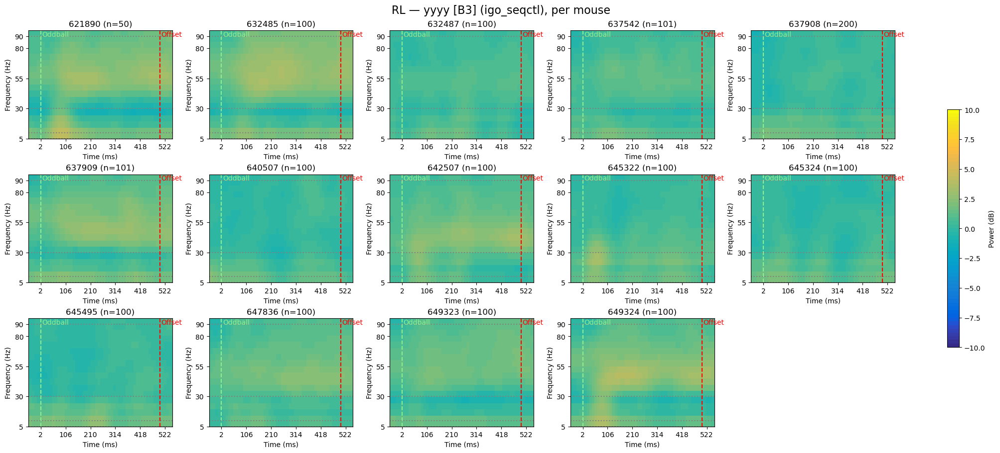

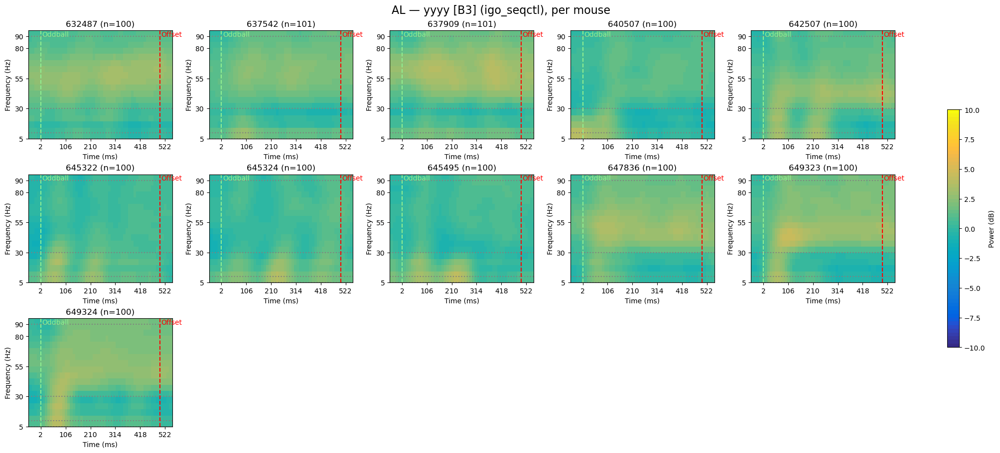

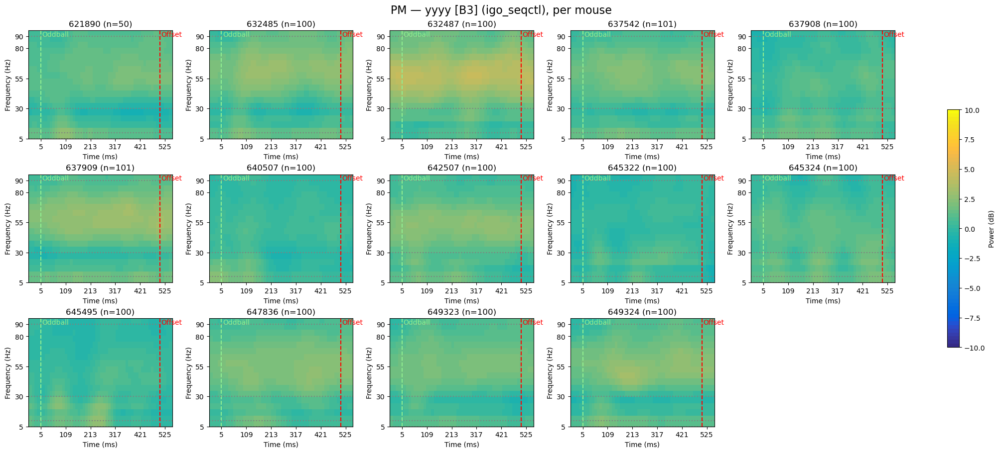

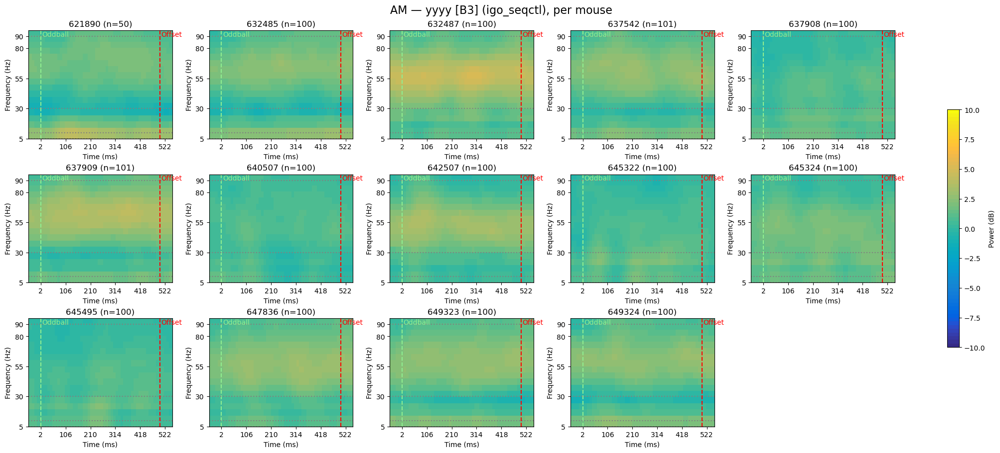

In [22]:
for cond in CONDITIONS:
    outdir = "%s_%s" % (os.path.basename(SPECTRO_ROOT), cond)
    os.makedirs(outdir, exist_ok=True)
    for area in anatomical_areas:
        fig = mouse_grid(cond, area)
        if fig is None:
            continue
        fig.savefig("%s/%s_bymouse_oddball.svg" % (outdir, area), bbox_inches="tight")
        fig.savefig("%s/%s_bymouse_oddball.png" % (outdir, area), bbox_inches="tight")
        plt.show()
        plt.close(fig)

## RL focus: area RL across every mouse and condition

The primary view for the suspected RL outlier — every mouse's RL spectrogram, per condition.

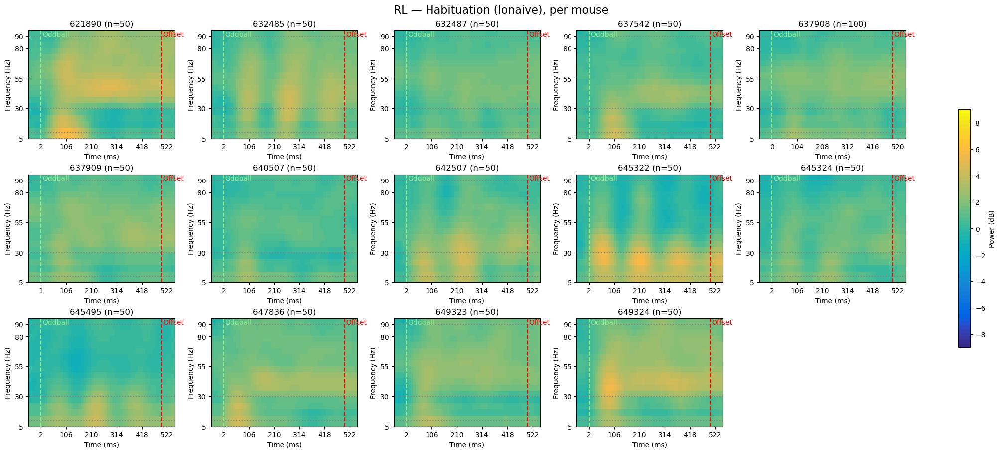

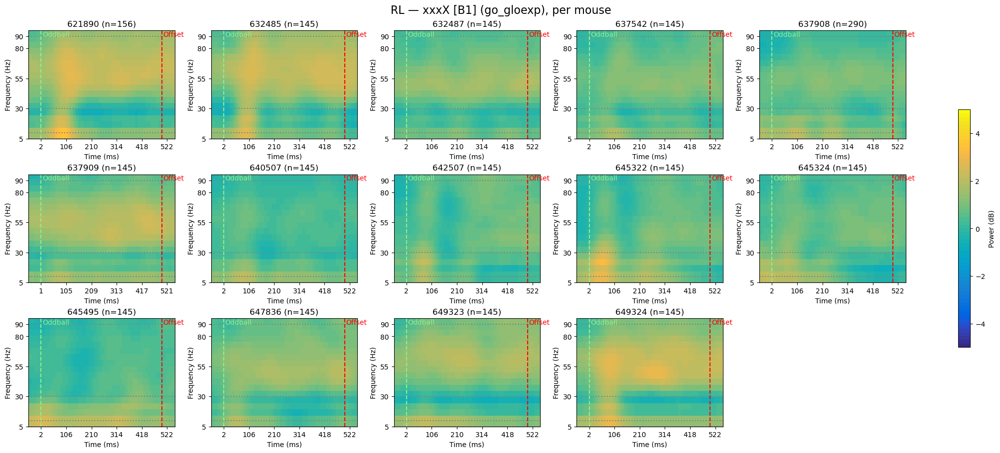

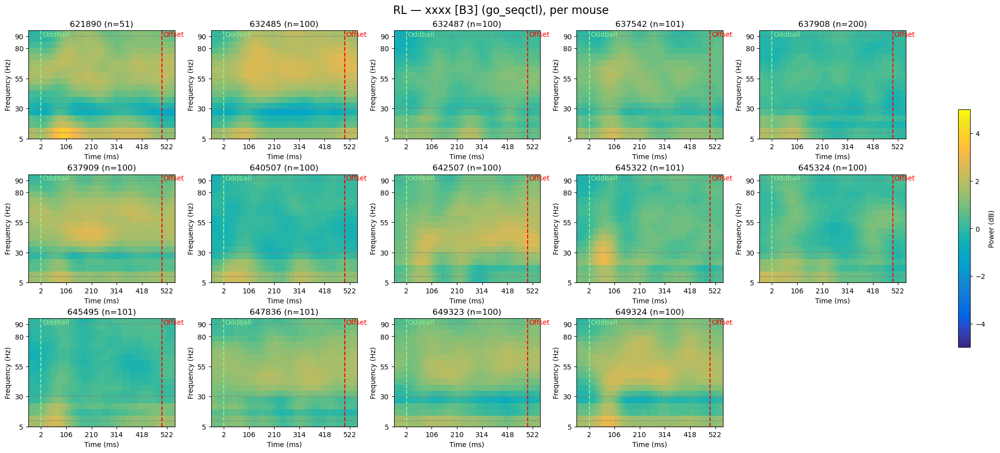

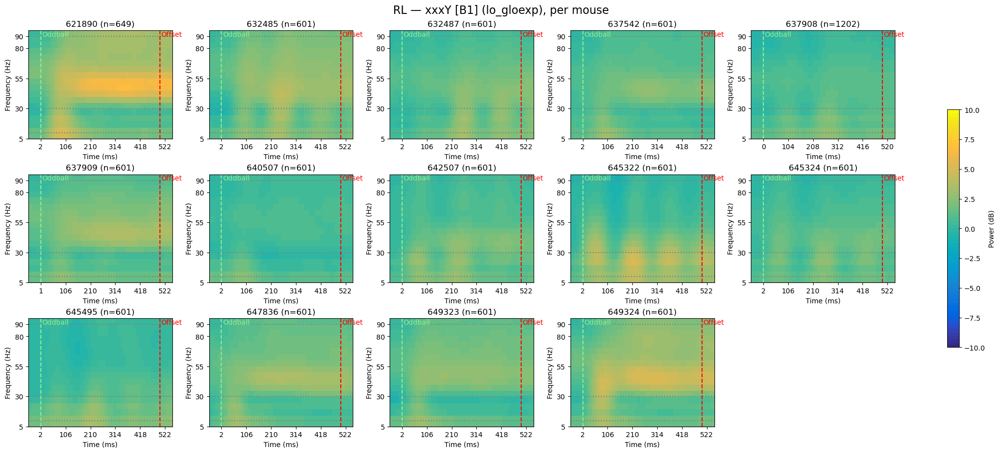

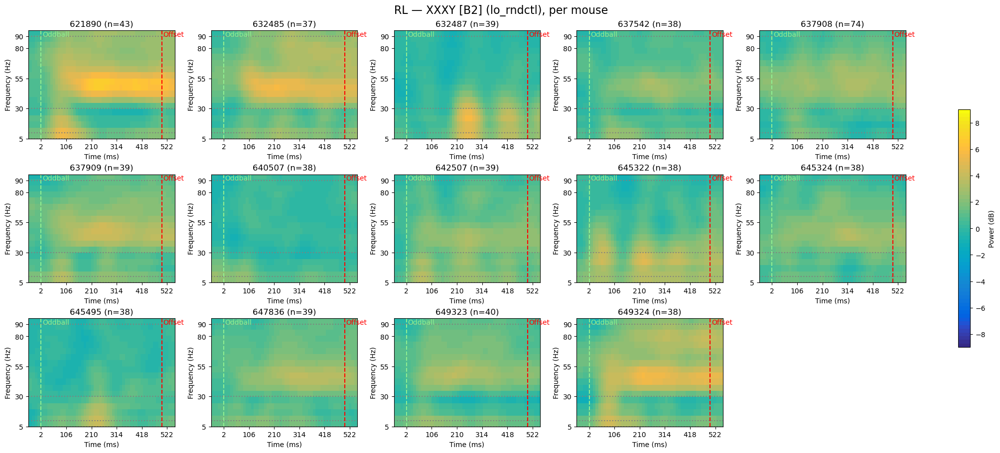

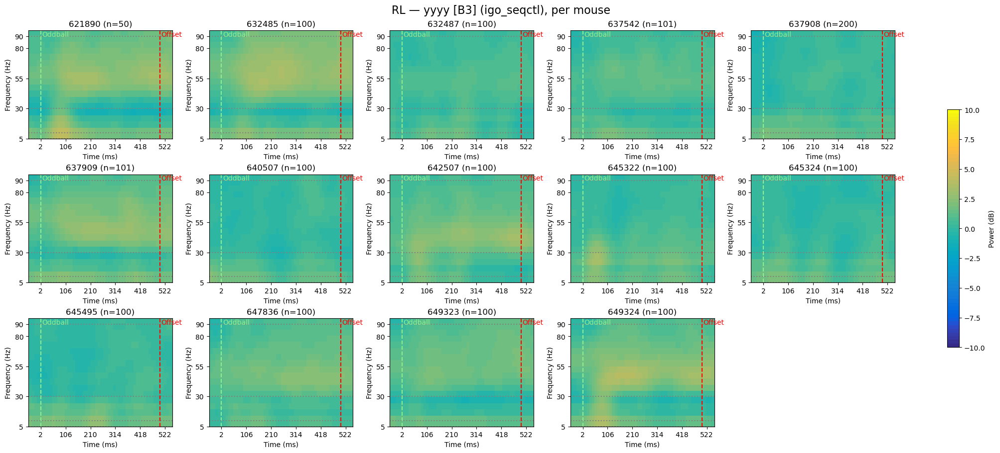

In [23]:
FOCUS_AREA = "VISrl"
for cond in CONDITIONS:
    fig = mouse_grid(cond, FOCUS_AREA)
    if fig is None:
        continue
    fig.savefig("%s_%s/%s_bymouse_oddball.svg" % (
        os.path.basename(SPECTRO_ROOT), cond, FOCUS_AREA), bbox_inches="tight")
    plt.show()
    plt.close(fig)

## Doubled-probe diagnostic

For the subject×areas where two probes were pooled (`sub-637908` RL, `sub-621890`/`sub-632485` LM),
split the **trial-resolved** TFR back into its individual probes to check whether the two probes
agree. If they disagree, the pooling in the grand pipeline is mixing dissimilar signals into that
area's contrast; if one probe is itself anomalous, that's our outlier. Because pooling concatenated
trials in probe order, we recover each probe by slicing the trial axis.

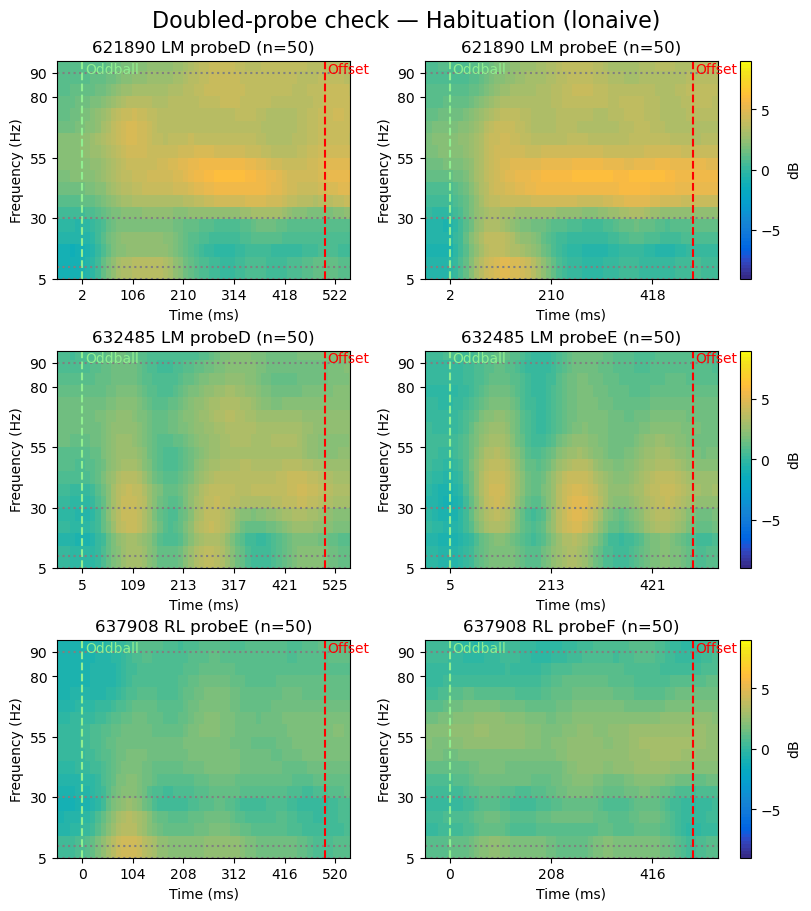

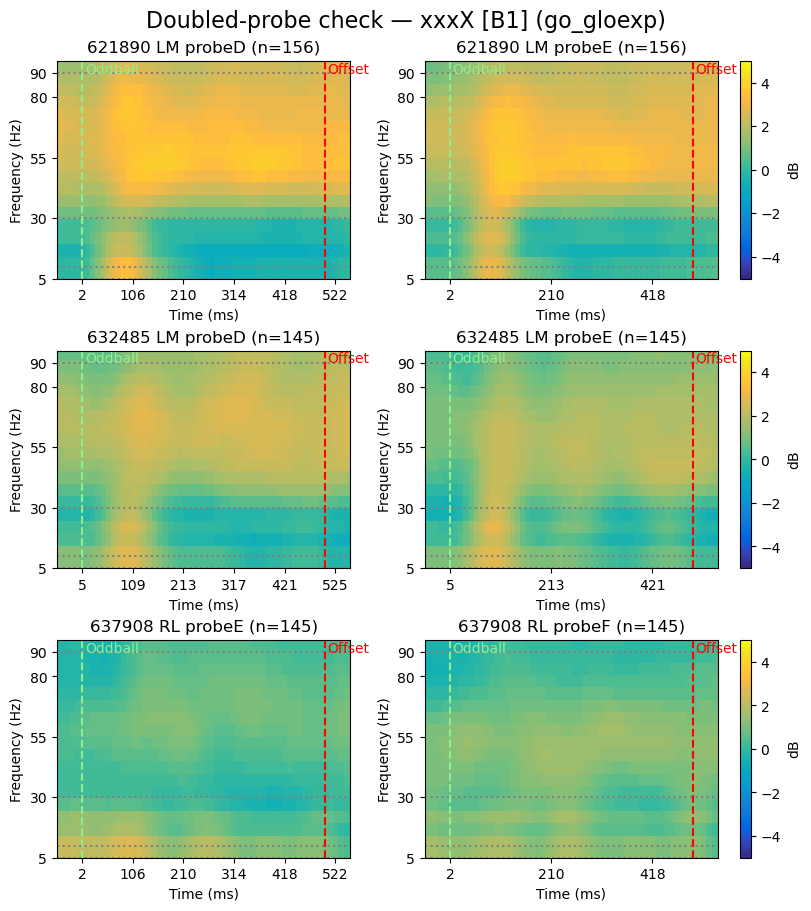

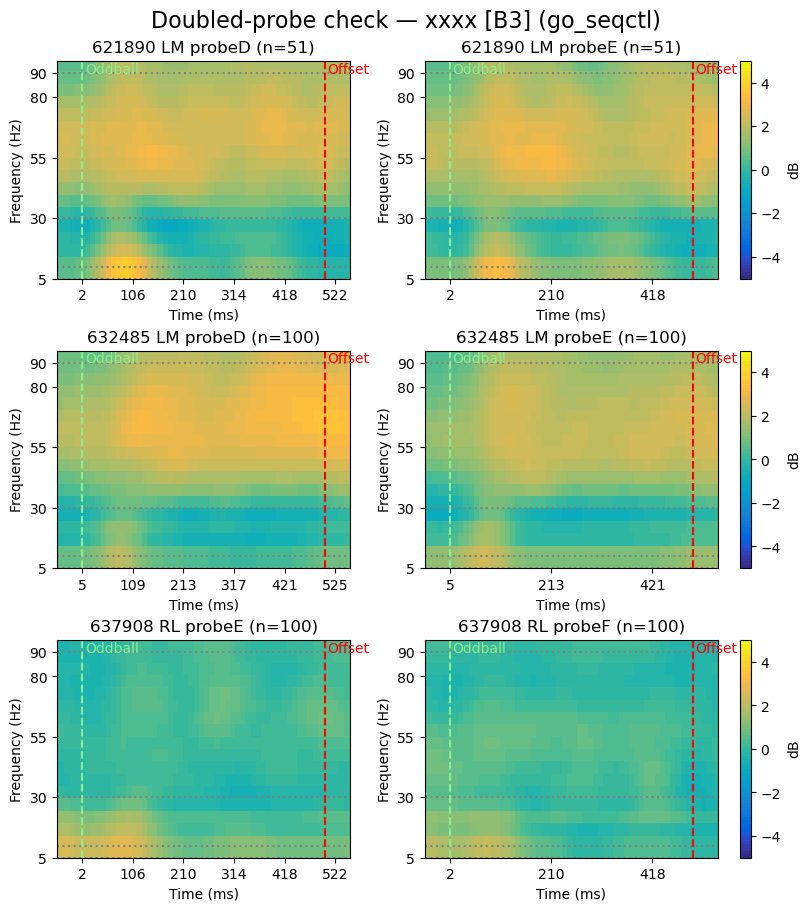

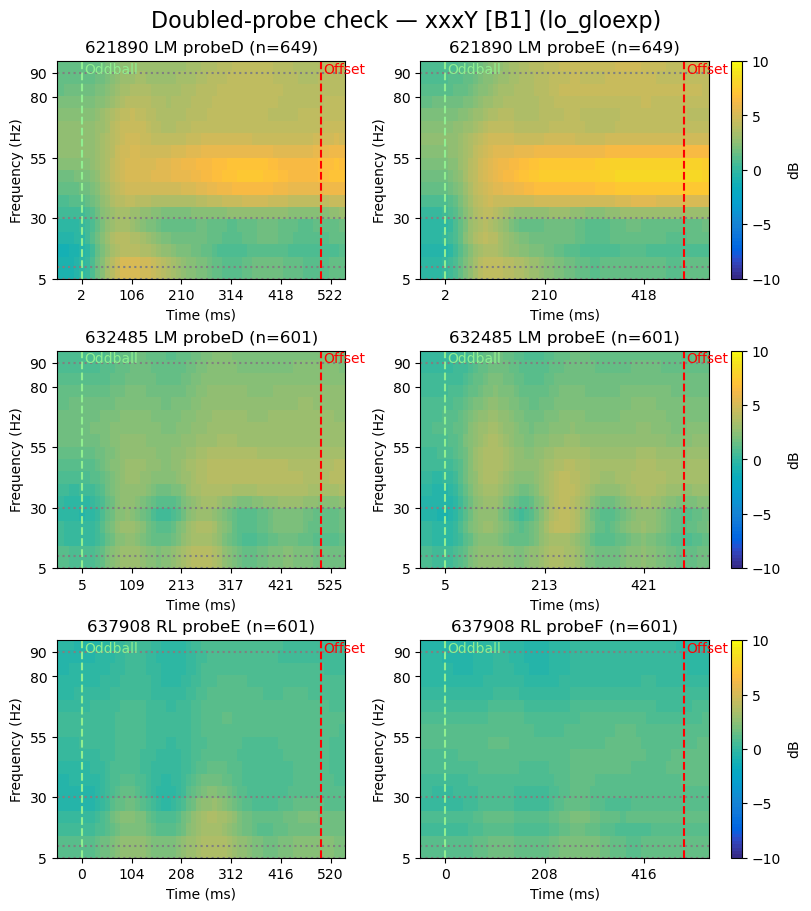

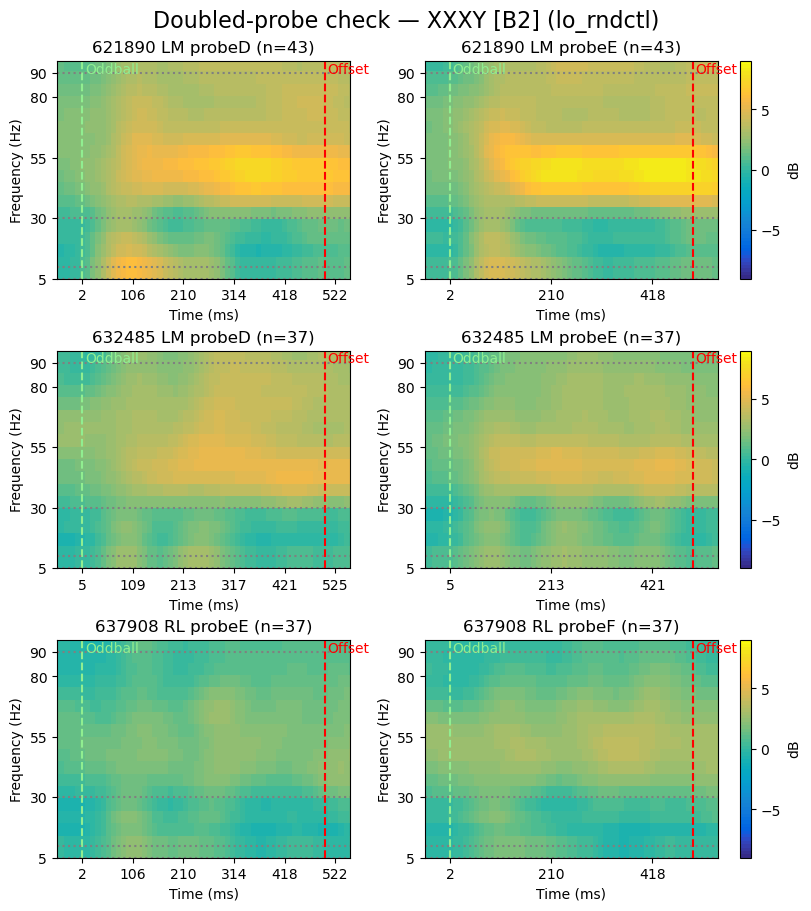

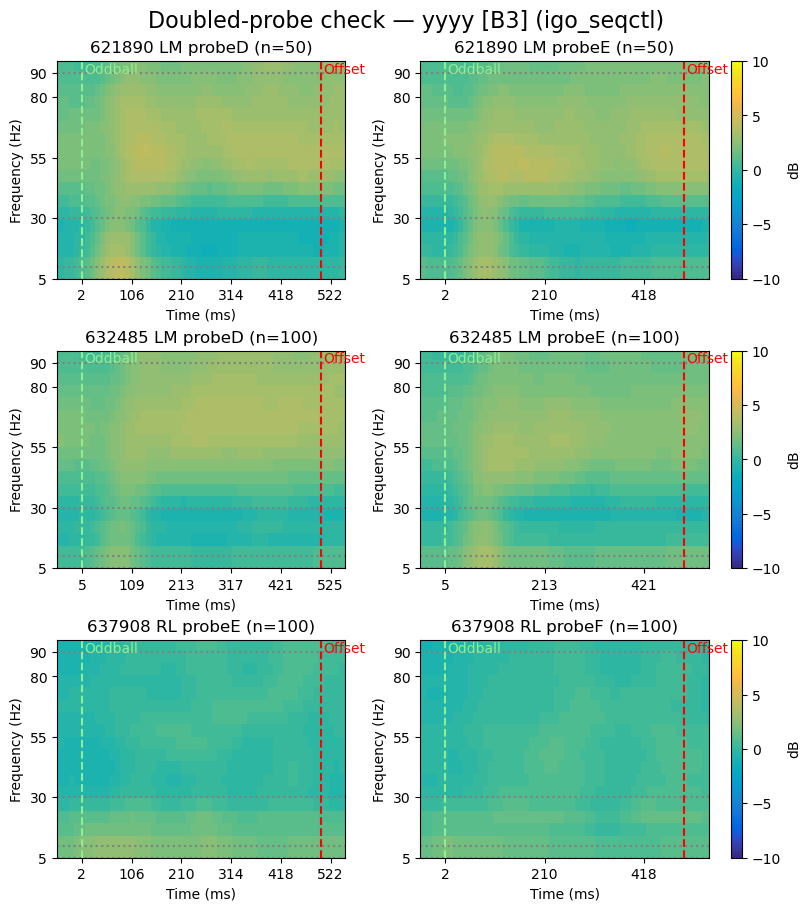

In [24]:
def probe_evoked(epoched_tfr, lo, hi):
    """Trial-average a trial-range [lo:hi) of a trial-resolved EpochedTfr, in dB, for eyeballing."""
    sub = epoched_tfr.fmap(lambda d: d[..., lo:hi])
    return sub.oscillatory().select_freqs(*FREQ_RANGE).evoked().decibels()

def trial_ranges(total, nparts):
    """Split `total` pooled trials into `nparts` contiguous, (near-)equal probe blocks."""
    step = total // nparts
    bounds = [(i * step, (i + 1) * step) for i in range(nparts)]
    bounds[-1] = (bounds[-1][0], total)   # last probe absorbs any remainder
    return bounds

def doubled_probe_figure(cond):
    doubled = doubled_areas(cond)
    if not doubled:
        return None
    kindex = area_k_index(cond)
    rows = []   # (subject, area, [(probe, evoked_db, n), ...])
    for (subject, area), probes in sorted(doubled.items()):
        summary = subject_condition_summary(cond, subject, kindex)   # cache-hit reload
        if summary is None or area not in summary.stats:
            continue
        tfr = summary.results().signals[area]
        panels = [(probes[i], probe_evoked(tfr, lo, hi), hi - lo)
                  for i, (lo, hi) in enumerate(trial_ranges(tfr.num_trials, len(probes)))]
        rows.append((subject, area, panels))
    if not rows:
        return None
    ncols = max(len(p) for _, _, p in rows)
    fig, axes = plt.subplots(len(rows), ncols, figsize=(4 * ncols, 3 * len(rows)),
                             squeeze=False, layout="constrained")
    vlim = CONDITION_VLIMS[cond]
    for r, (subject, area, panels) in enumerate(rows):
        for c in range(ncols):
            ax = axes[r][c]
            if c >= len(panels):
                ax.axis("off"); continue
            probe, ev, n = panels[c]
            oddball_window(ev).heatmap(ax=ax, fig=fig, vmin=-vlim, vmax=vlim,
                                       cbar=(c == len(panels) - 1),
                                       title="%s %s %s (n=%d)" % (subject.replace("sub-", ""),
                                                                  stattitle(area), probe, n),
                                       tlabel="Time (ms)", **EVENTS)
    fig.suptitle("Doubled-probe check — %s (%s)" % (CONDITION_TITLES[cond], cond), fontsize=16)
    return fig

for cond in CONDITIONS:
    fig = doubled_probe_figure(cond)
    if fig is None:
        logging.info("No doubled probes for condition %s", cond)
        continue
    fig.savefig("%s_%s/doubled_probes.png" % (os.path.basename(SPECTRO_ROOT), cond),
                bbox_inches="tight")
    plt.show()
    plt.close(fig)